In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import glob
import pickle
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [3]:
# Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import glob
#os.listdir("test_images/")
#https://view5639f7e7.udacity-student-workspaces.com/tree/CarND-Advanced-Lane-Lines/camera_cal


obj_points=[]
img_points=[]

#nx = 9#TODO: enter the number of inside corners in x
#ny = 6#TODO: enter the number of inside corners in y


fname = glob.glob(('camera_cal/calibration*.jpg'))

for nx in range(6,10):
    for ny in range (5,7):
        for image_name in fname:
            #print (image_name)
            objp=np.zeros((ny*nx,3),np.float32)
            objp[:,:2]=np.mgrid[0:nx,0:ny].T.reshape(-1,2)

            img = cv2.imread(image_name)
            
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            image_2D_shape= gray.shape[::-1]

            # Find the chessboard corners
            ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

            if ret == True:
                img_points.append(corners)
                obj_points.append(objp)    
                print("found for:",image_name)
            
            
    
    
    
    # prepare object points



found for: camera_cal/calibration15.jpg
found for: camera_cal/calibration4.jpg
found for: camera_cal/calibration7.jpg
found for: camera_cal/calibration11.jpg
found for: camera_cal/calibration15.jpg
found for: camera_cal/calibration16.jpg
found for: camera_cal/calibration5.jpg
found for: camera_cal/calibration5.jpg
found for: camera_cal/calibration14.jpg
found for: camera_cal/calibration2.jpg
found for: camera_cal/calibration1.jpg
found for: camera_cal/calibration9.jpg
found for: camera_cal/calibration15.jpg
found for: camera_cal/calibration10.jpg
found for: camera_cal/calibration12.jpg
found for: camera_cal/calibration17.jpg
found for: camera_cal/calibration7.jpg
found for: camera_cal/calibration20.jpg
found for: camera_cal/calibration19.jpg
found for: camera_cal/calibration8.jpg
found for: camera_cal/calibration11.jpg
found for: camera_cal/calibration14.jpg
found for: camera_cal/calibration13.jpg
found for: camera_cal/calibration18.jpg
found for: camera_cal/calibration16.jpg
found for

In [16]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_points, img_points, image_2D_shape, None, None)
with open('distortion.pickle', 'wb') as f:
    pickle.dump([mtx, dist], f)

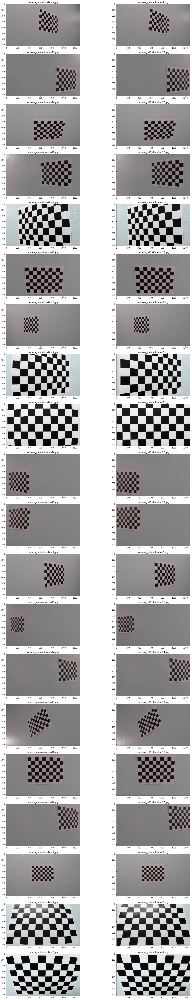

In [4]:
fname = glob.glob(('camera_cal/calibration*.jpg'))

fig=plt.figure(figsize=(20,100)) # for images before and after to display side by side 



for idx,im in enumerate(fname):
    img = cv2.imread(im)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    ax0=fig.add_subplot(20,2,(2*idx)+1)
    ax1=fig.add_subplot(20,2,(2*idx)+2)
    
    ax0.set_title(im)    
    ax1.set_title(im)
    
    ax0.imshow(img, cmap='gray')
    ax1.imshow(undist, cmap='gray')




In [47]:
# Define a function that takes an image, number of x and y points, 
# camera matrix and distortion coefficients
def corners_unwarp(img, nx, ny, mtx, dist):
    # Use the OpenCV undistort() function to remove distortion
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # Convert undistorted image to grayscale
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    # Search for corners in the grayscaled image
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    if ret == True:
        # If we found corners, draw them! (just for fun)
        cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
        # Choose offset from image corners to plot detected corners
        # This should be chosen to present the result at the proper aspect ratio
        # My choice of 100 pixels is not exact, but close enough for our purpose here
        offset = 150 # offset for dst points
        offsetX = 275 # offset for dst points
        offsetY = 90# offset for dst points(200,25)
    
        # Grab the image shape
        img_size = (gray.shape[1], gray.shape[0])

        # For source points I'm grabbing the outer four detected corners
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        # For destination points, I'm arbitrarily choosing some points to be
        # a nice fit for displaying our warped result 
        # again, not exact, but close enough for our purposes
        dst = np.float32([[offsetX, offsetY], [img_size[0]-offsetX, offsetY], 
                                     [img_size[0]-offsetX, img_size[1]-offsetY], 
                                     [offsetX, img_size[1]-offsetY]])
        # Given src and dst points, calculate the perspective transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
        # Warp the image using OpenCV warpPerspective()
        warped = cv2.warpPerspective(undist, M, img_size)

    # Return the resulting image and matrix
    return (warped, M,undist)

<class 'numpy.ndarray'>
(1280, 720)


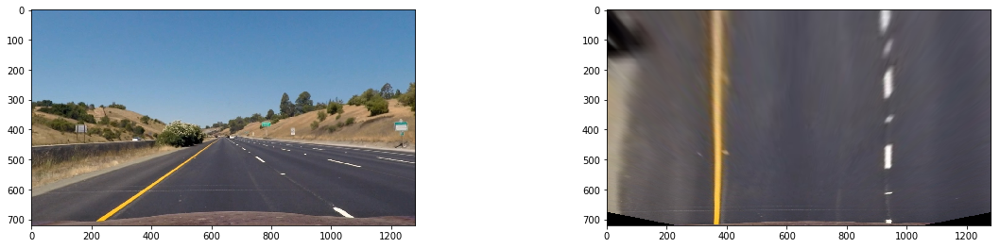

In [6]:
im="test_images/straight_lines1.jpg"

img = cv2.imread(im)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

print(type(img))
img_size = (img.shape[1], img.shape[0])
print(img_size)
fig=plt.figure(figsize=(20,100)) # for images before and after to display side by side 
idx=0
ax0=fig.add_subplot(20,2,(2*idx)+1)
ax1=fig.add_subplot(20,2,(2*idx)+2)
    
#ax0.set_title(im)    
#ax1.set_title(im)

with open('distortion.pickle', 'rb') as f:
    mtx_pickle, dist_pickle = pickle.load(f)
undist = cv2.undistort(img, mtx_pickle, dist_pickle, None, mtx_pickle)
    

src = np.float32([[200,720],[1130,720],[690,450],[595,450]])
dst = np.float32([[360,720],[955,720],[965,0],[360,0]])
M_warp = cv2.getPerspectiveTransform(src, dst)

warped = cv2.warpPerspective(undist, M_warp, img_size)



ax0.imshow(undist, cmap='gray')
ax0.imshow(undist)
ax1.imshow(warped, cmap='gray')



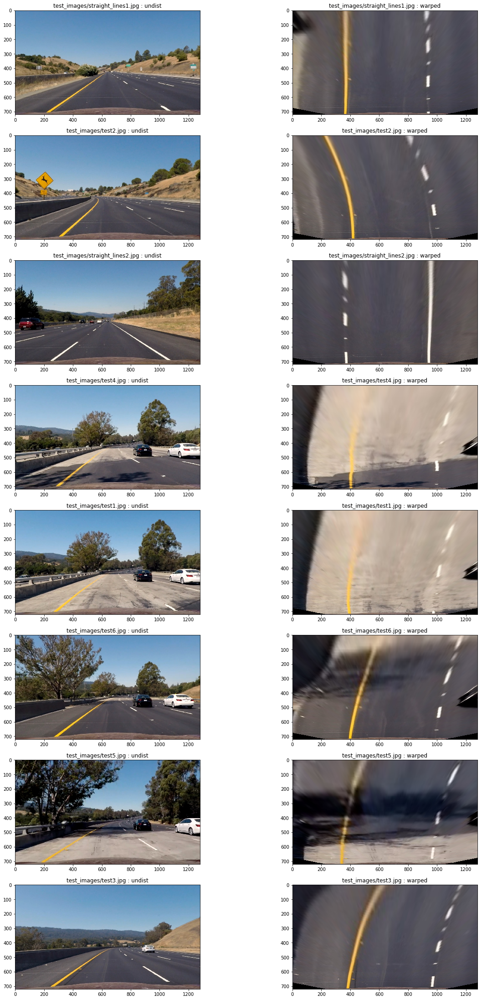

In [4]:
fname = glob.glob("test_images/*.*")

with open('distortion.pickle', 'rb') as f:
    mtx_pickle, dist_pickle = pickle.load(f)
 

fig=plt.figure(figsize=(20,100)) # for images before and after to display side by side 

src = np.float32([[200,720],[1130,720],[690,450],[595,450]])
dst = np.float32([[360,720],[955,720],[965,0],[360,0]])
#dst = np.float32([[360,720],[955,720],[965,100],[360,100]])

M_warp = cv2.getPerspectiveTransform(src, dst)


for idx,im in enumerate(fname):

    img = cv2.imread(im)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_size = (img.shape[1], img.shape[0])

    undist = cv2.undistort(img, mtx_pickle, dist_pickle, None, mtx_pickle)
    warped = cv2.warpPerspective(undist, M_warp, img_size)
    
    ax0=fig.add_subplot(20,2,(2*idx)+1)
    ax1=fig.add_subplot(20,2,(2*idx)+2)
    
    ax0.set_title(im+" : undist")    
    ax1.set_title(im+" : warped")
    
    ax0.imshow(undist, cmap='gray')
    ax1.imshow(warped, cmap='gray')


In [9]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Take the absolute value of the x and y gradients
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    # 5) Create a binary mask where direction thresholds are met
    # 6) Return this mask as your binary_output image
    # Define a function to threshold an image for a given range and Sobel kernel
    # Grayscale
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel))
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    sobelx[(scaled_sobel < 30) | (scaled_sobel > 200)] = 0

    
    
    
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    return binary_output


In [3]:
def sobelx_dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    
    # 1) conversion to gray Grayscale for Sobel calculation
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2)  exclude low sobelx gradient points (since the lane is mostly vertical)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel))
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    sobelx[(scaled_sobel < 20)] = 0
    
    # 3) calculate sobely:
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
  
    # 4) calculate the absolute value of the gradient direction, 
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    
    # apply an threshold (possible angle of the lane: kind ofsimilar to a polymask region of interest) 
    # and create a binary image 
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1


    return binary_output
    

In [5]:
def S_sobelx_dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    
    # S is already a 2D , 8 bits 
    # 2)  exclude low sobelx gradient points (since the lane is mostly vertical)
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    abs_sobel = np.absolute(cv2.Sobel(img, cv2.CV_64F, 1, 0,ksize=sobel_kernel))
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    sobelx[(scaled_sobel < 20)] = 0
    
    # 3) calculate sobely:
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
   
    # 4) calculate the absolute value of the gradient direction, 
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    
    # apply an threshold (possible angle of the lane: kind ofsimilar to a polymask region of interest) 
    # and create a binary image 
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    return binary_output
    

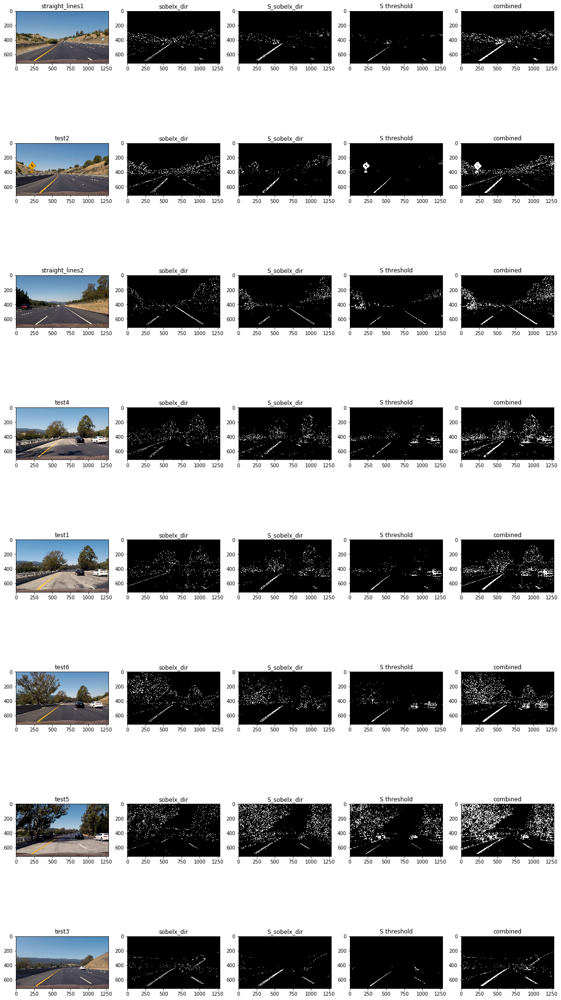

In [10]:
im_list=os.listdir("test_images/")
#print(im_list)

fig=plt.figure(figsize=(20,100)) # for images before and after to display side by side 


for idx,im in enumerate(im_list):
    im_title=im.replace(".jpg","")
    img=mpimg.imread('test_images/'+im)
    
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2] 
    
    img1= sobelx_dir_threshold(img, sobel_kernel=7, thresh=(0.7, 1.3))
    img2= S_sobelx_dir_threshold(S, sobel_kernel=7, thresh=(0.7, 1.3))    
    img3=np.zeros_like(S)
    img3[(S>200)]=1
    img4=np.zeros_like(S)
    img4[(img1==1)|(img2==1)|(img3==1)]=1
        
    img0_title=im_title
    img1_title="sobelx_dir"
    img2_title="S_sobelx_dir"   
    img3_title="S threshold"
    img4_title="combined"


    #img2= cv2.undistort(img1, mtx, dist, None, mtx)
    #ax1=fig.add_subplot(20,2,(2*idx)+1)

    #ax1.imshow(img1)
    #ax1.imshow(img3)
    #ax2=fig.add_subplot(20,2,(2*idx)+2)
    ax0=fig.add_subplot(20,5,(5*idx)+1)
    ax1=fig.add_subplot(20,5,(5*idx)+2)
    ax2=fig.add_subplot(20,5,(5*idx)+3)
    ax3=fig.add_subplot(20,5,(5*idx)+4)
    ax4=fig.add_subplot(20,5,(5*idx)+5)
  
    ax0.set_title(img0_title)    
    ax1.set_title(img1_title)
    ax2.set_title(img2_title)
    ax3.set_title(img3_title)
    ax4.set_title(img4_title)
  
    ax0.imshow(img, cmap='gray')
    ax1.imshow(img1, cmap='gray')
    ax2.imshow(img2, cmap='gray')
    ax3.imshow(img3, cmap='gray')
    ax4.imshow(img4, cmap='gray')

        

In [14]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows based on nwindows above and image shape

    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    print(nonzeroy)
    print(nonzerox)
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
  
    
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]

        # explanation about inds: the indexes of the non zero points within nonzerox and nonzeroy
        # (P1,...,Pk): list of Pi <>0 
        # len(nonzerox)=len(nonzeroy)= len(nonzero[0], len(nonzero[1])
        # nonzerox=(x1,...,xk), nonzeroy=(y1,...,yk)
        # nonzero= (nonzerox, nonzeroy): so non zero points have the same index within nonzerox and nonzeroy
        #((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) verifies that the y coordinates of these nonzero points are within the window ywise,  same with (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high))
        # and the & only take the nonzero meeting these 2 requirements
        # then it zeros out the nonzero points not in this window (where these two conditions should be met)


        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


In [16]:
def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

    return out_img


#out_img = fit_polynomial(binary_warped)

#plt.imshow(out_img)


<class 'numpy.ndarray'>
(1280, 720)
<class 'numpy.ndarray'>
(1280, 720)
<class 'numpy.ndarray'>
(1280, 720)
<class 'numpy.ndarray'>
(1280, 720)
<class 'numpy.ndarray'>
(1280, 720)
<class 'numpy.ndarray'>
(1280, 720)
<class 'numpy.ndarray'>
(1280, 720)
<class 'numpy.ndarray'>
(1280, 720)


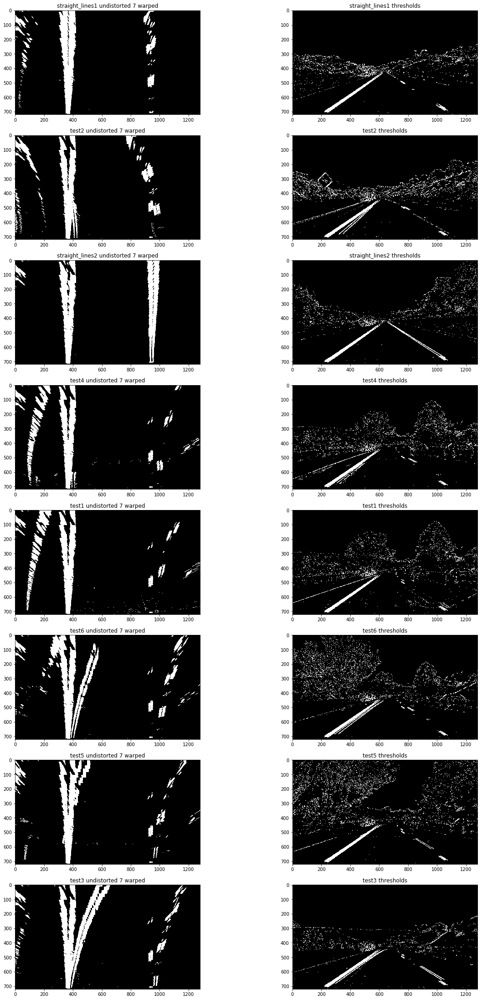

In [25]:
fname = glob.glob("test_images/*.*")

#print(im_list)

fig=plt.figure(figsize=(20,100)) # for images before and after to display side by side 


for idx,im in enumerate(fname):

    img = cv2.imread(im)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

    print(type(img))
    img_size = (img.shape[1], img.shape[0])
    print(img_size)
    ax0=fig.add_subplot(20,2,(2*idx)+1)
    ax1=fig.add_subplot(20,2,(2*idx)+2)
    
    ##### REMOVE CAMERA DISTORTION-----------------------------------

    with open('distortion.pickle', 'rb') as f:
        mtx_pickle, dist_pickle = pickle.load(f)
    undistorted = cv2.undistort(img, mtx_pickle, dist_pickle, None, mtx_pickle)
    
    ##### SEVERAL SOBEL BASE & THRESHOLD FILTERING-----------------
    hls = cv2.cvtColor(undist, cv2.COLOR_RGB2HLS)
    
    S = hls[:,:,2]   
    img1= sobelx_dir_threshold(img, sobel_kernel=7, thresh=(0.7, 1.3))
    img2= S_sobelx_dir_threshold(S, sobel_kernel=7, thresh=(0.7, 1.3))    
    img3=np.zeros_like(S)
    img3[(S>200)]=1
    img4=np.zeros_like(S)
    img4[(img1==1)|(img2==1)|(img3==1)]=1

    ##### PERPECTIVE RECTIFICATION-----------------------------------

    src = np.float32([[200,720],[1130,720],[690,450],[595,450]])
    dst = np.float32([[360,720],[955,720],[965,0],[360,0]])
    img_size = (img4.shape[1], img4.shape[0])

    M_warp = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img4, M_warp, img_size)
     
    im_title=im.replace("test_images/","")
    im_title=im_title.replace(".jpg","")
    img0_title= im_title+" undistorted 7 warped"
    thresholds="sobelX_dir, SsobelX_dir, S"
    img1_title= im_title+" thresholds"

    ax0.set_title(img0_title)    
    ax1.set_title(img1_title)
    ax0.imshow(warped, cmap='gray')
    ax1.imshow(img4, cmap='gray')



In [ ]:
#&&&&&&&&&&&&&&
yellow_output = 'test_videos_output/solidYellowLeft.mp4'
#white_output = 'test_videos_output/solidWhiteRight.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
#clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4")
clip2 = VideoFileClip("test_videos/solidYellowLeft.mp4").subclip(0,5)
Init_Param(10)
yellow_clip = clip2.fl_image(process_image)#.subclip(0,5) #NOTE: this function expects color images!!
#yellow_clip = clip2.fl_image(process_image) #NOTE: this function expects color images!!
%time yellow_clip.write_videofile(yellow_output, audio=False)
#white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
#%time white_clip.write_videofile(white_output, audio=False)

In [ ]:

# COLOR FILTERING FUNCTIONS

def HSL_color_picker(H,S,L):
    """
    # HLS values have to beconverted in [0..255] values for cv2 usage 
    # H value can be arbitrary, [0 ... 360](degrees on the color wheel ) (OpenCV: [0 ... 180]!!!)
    # L  [1 ... 100] % on the luminosity axis (OpenCV: [0 ... 255]): low~shade(i.e black),high~color
    # S [1 ... 100] % on the satuation axis (OpenCV: [0 ... 255])] low~faded(i.e white) high~normal lighting"""
    
    if H not in range(0,361):
        print("Hue should be in range(0,360) ")

    if S not in range(0,255):
        print("Saturation tu should be in range(0,256) ")
    if L not in range(0,255):
        print("Luminosity should be in range(0,256) ")
    return(np.array([np.round( H/2), np.round(255*L/100 ), np.round(255*S/100)]))

    
    #return(np.array([np.round( H/2), np.round(255*S/100 ), np.round(255*L/100)]))
    
    #white_upper = np.array([np.round(360 / 2), np.round(1.00 * 255), np.round(0.30 * 255)])


def filter_color_mask(image_RGB,lower_filter = np.array([0,0,0]), higher_filter = np.array([0,0,0])):#create a
    # "image" : format is RGB, 
    # filters are Hue, Luminosity, Saturation
    image_HLS=cv2.cvtColor(image_RGB, cv2.COLOR_RGB2HLS) #conversion to HLS
    mask = cv2.inRange(image_HLS, lower_filter, higher_filter)
    return(mask)


global lower_white,higher_white,lower_yellow,higher_yellow
    
lower_yellow= HSL_color_picker(40,50,30)
higher_yellow=HSL_color_picker(70,100,83) 
    
lower_white=HSL_color_picker(0,0,75)
higher_white=HSL_color_picker(360,45,100)
     

def yellow_white_filter(image):
    
    white_mask=filter_color_mask(image,lower_white,higher_white)
    yellow_mask = filter_color_mask(image,lower_yellow,higher_yellow)
    mask = white_mask+yellow_mask
    mask=mask.astype(np.uint8)
    
    image_color_mask=cv2.bitwise_and(image, image, mask = mask)
    return(image_color_mask)
